In [9]:
using QuadGK
using Polynomials
using Plots

┌ Info: Recompiling stale cache file /home/mszarek/.julia/compiled/v1.0/Plots/ld3vC.ji for Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80]
└ @ Base loading.jl:1190
┌ Warning: Module Compat with build ID 12833422794783 is missing from the cache.
│ This may mean Compat [34da2185-b29b-5c13-b0c7-acf172513d20] does not support precompilation but is imported by a module that does.
└ @ Base loading.jl:947
┌ Warning: Module Compat with build ID 12833422794783 is missing from the cache.
│ This may mean Compat [34da2185-b29b-5c13-b0c7-acf172513d20] does not support precompilation but is imported by a module that does.
└ @ Base loading.jl:947
┌ Info: Precompiling Showoff [992d4aef-0814-514b-bc4d-f2e9a6c4116f]
└ @ Base loading.jl:1192
┌ Warning: Module Compat with build ID 12833422794783 is missing from the cache.
│ This may mean Compat [34da2185-b29b-5c13-b0c7-acf172513d20] does not support precompilation but is imported by a module that does.
└ @ Base loading.jl:947
┌ Info: Recompiling stale cache 

┌ Info: Recompiling stale cache file /home/mszarek/.julia/compiled/v1.0/GR/NDU5Y.ji for GR [28b8d3ca-fb5f-59d9-8090-bfdbd6d07a71]
└ @ Base loading.jl:1190


<a href="https://www.icsr.agh.edu.pl/~mownit/pdf/06_kwadratury.pdf"> Wykład </a>

Kwadratury Gaussa bazują na tzw. odciętych punktów Gaussa $x_{i}$ oraz współczynnikach $a_{i}$


In [4]:
# funkcja obliczająca odcięte punktów Gaussa oraz ich współczynniki 
(xp,a)=gauss(Float64,7)


([-0.949108, -0.741531, -0.405845, 0.0, 0.405845, 0.741531, 0.949108], [0.129485, 0.279705, 0.38183, 0.417959, 0.38183, 0.279705, 0.129485])

Podstawowe użycie w/w danych: 
aby policzyć $\int_{-1}^{1} f dx$  używamy odciętych punktów wraz z wagami wg wzoru 
$\sum_{i=1}^{n}{a_{i}f(x_{i})}$


In [5]:
f(x)=x^2
sum(a .* f.(xp)) 

0.6666666666666669

### Zadanie 1
- Korzytając z pakietu <a href="https://github.com/JuliaMath/Polynomials.jl">Polynomials</a> zaimplentuj wielomiany Legendre'a zdefiniowane w taki sposób:

$P_{0}(x)=1$

$P_{1}(x)=x$

$P_{k+1}(x)=\frac{2k+1}{k+1} x P_{k}(x)-\frac{k}{k+1}P_{k-1}(x)$

- narysuj ich wykresy w przedziale (-1,1). 
- sprawdź(np. za pomocą fukcji <i>roots</i> z pakietu Polynomials), że ich zera  sa odciętymi punktów Gaussa. Test wykonaj dla wielomianow od 2 do 4 stopnia
- podaj związek tego faktu z podstawowym twierdzeniem kwadratur Gaussa (z wykładu)

In [8]:
function legendre(n)
    if (n == 0)
        Poly([1])
    elseif (n == 1)
        Poly([0, 1])
    else 
        ((2*n-1)/(n))*Poly([0,1])*legendre(n-1) - ((n-1)/n)*legendre(n-2)
    end
end
        
println(legendre(2))
println(legendre(3))
println(legendre(4))

Poly(-0.5 + 1.5*x^2)
Poly(-1.5*x + 2.5*x^3)
Poly(0.375 - 3.75*x^2 + 4.375*x^4)


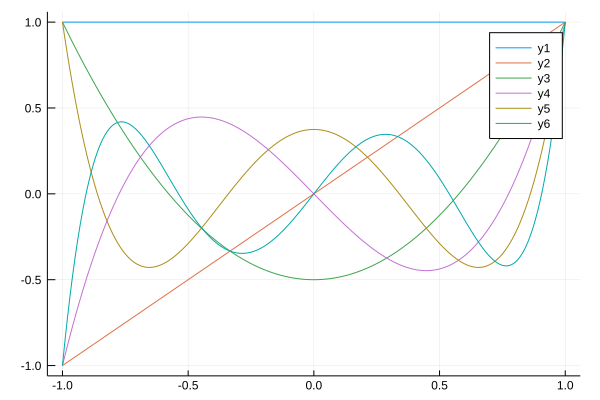

In [10]:
plot()

xs = -1:0.01:1
for i = 0:5
    ys = legendre(i)(xs)
    fit = polyfit(xs, ys)
    plot!(xs, polyval(fit, xs))
end

plot!()

- sprawdź(np. za pomocą fukcji roots z pakietu Polynomials), że ich zera sa odciętymi punktów Gaussa. Test wykonaj dla wielomianow od 2 do 4 stopnia

In [11]:
for i = 2:5
    root = roots(legendre(i))
    (xp, a) = gauss(Float64, i)
    print(root)
    println(xp)
end

[-0.57735, 0.57735][-0.57735, 0.57735]
[-0.774597, 0.774597, 0.0][-0.774597, 0.0, 0.774597]
[-0.861136, 0.861136, -0.339981, 0.339981][-0.861136, -0.339981, 0.339981, 0.861136]
[-0.90618, -0.538469, 0.90618, 0.538469, 0.0][-0.90618, -0.538469, 0.0, 0.538469, 0.90618]


- podaj związek tego faktu z podstawowym twierdzeniem kwadratur Gaussa (z wykładu)

Odcięte $x_i$ n-punktowej kwadratury Gaussa z funkcją ważącą $w(x)$ w $[a, b]$ są zerami wielomianu ortogonalnego (wielomiany Legendre'a należą do zbioru wielomianów ortogonalnych) $\phi_n(x)$ dla tego samego przedziału i tej samej funkcji ważącej

### Zadanie 2
- Napisz funkcję, która dla podanej liczby punktów Gaussa $k$ oraz funkcji $f$  policzy $\int_{-1}^{1} f dx$
metodą używającą funkcji:
```julia
gauss(k)
```
oraz sumy 
```julia
sum(a .* f.(xp)) 
```
- przetestuj dla wielomianów coraz większych stopni
- sprawdz kiedy przestaje być dokładna, 
- podaj związek z twierdzeniem o  stopniu dokładności kwadratury Gaussa 

In [16]:
function quadrature(f, k)
    res = 0
    zero_points = gauss(k)[1]
    n = k
    for i = 1:k
        x_i = zero_points[i]
        w_i = (2 * (1 - (x_i) ^ 2)) / ((n + 1) ^ 2 * ((legendre(n + 1)(x_i))^2))
        res += w_i * f(x_i)
    end
    res
end

println(quadrature(Poly([1]), 1))
println(quadrature(Poly([1, 2, 3]), 3))

2.0
4.000000000000003


### Twierdzenie o stopniu dokładności kwadratury Gaussa
#### Teza:
Kwadratura ma stopień dokładności $2n - 1$ (dla $n$-punktowej kwadratury); tzn. jest dokładna dla wielomianu:
$$P(X) = Q(x) \cdot \theta_n(x)+R(x)\text{; }Q, R\text{ - stopnia} < n$$

### Zadanie 3
 
Skorzystaj z rozwiązania zadania 2 do napisania funkcji 
liczącej  całki w dowolnym przedziale $\int_{a}^{b} f(x) dx$ 

dokonując normalizacji  do $\int_{-1}^{1} F(z) dz$ 

podstawiając:

$x=\frac{b+a}{2}+ \frac{b-a}{2} z $ oraz 

$dx =\frac{b-a}{2} dz $

Przetestuj działanie na kilku przykładach i sprawdź z wynikami otrzymanymi analitycznie.


In [24]:
function integrate(a, b, f, k)
    res = 0
    zero_pts = gauss(k)[1]
    n = k
    for i = 1:k
        x_i = (b + a) / 2 + zero_pts[i] * (b - a) / 2
        w_i = (2 * (1 - (x_i)^2)) / ((n + 1)^2 * ((legendre(n + 1)(x_i))^2))
        res += w_i * f(x_i) * (b - a) / 2
    end
    res
end

println(integrate(-1, 1, Poly([1]), 1))
println(integrate(-1, 1, Poly([1, 1]), 1))
println(integrate(-1, 1, Poly([1, 1, 1]), 2))
println(integrate(-1, 1, Poly([1, 1, 1, 1]), 3))

2.0
2.0
2.666666666666667
2.666666666666668


### Zadanie 4
Głowną funkcją pakietu QuadGK jest adaptacyjna funkcja <a href="https://juliamath.github.io/QuadGK.jl/stable/#QuadGK.quadgk"> guadgk</a> używająca całkowania  Gauss-Kronroda

- użyj tej funkcji do policzenia  całki dla przykładowego wielomianu.
- funkcja ta ma możliwość liczenia również całek do nieskończoności
 Policz całkę od minus do plus nieskonczonosci 
 standardowego rozkładu normalnego Gaussa
$ \frac{1}{\sqrt{2\pi}}exp(\frac{-x^2}{2})$

In [25]:
function gauss_distribution(x)
    (1 / sqrt(2 * pi)) * exp(-x^2 / 2)
end
    
(I, E) = quadgk(Poly([0, 1]), 0, 2)
println(I)
(I, E) = quadgk(gauss_distribution, typemin(Float64), typemax(Float64))
println(I)

2.0
1.0000000000032583


### Zadanie 5
Napisz własną funkcję całkującą metodą prostokątów albo trapezów. Narysuj wykres funkcji błędu
w stosunku do wyniku otrzymanego analitycznie 
w zaleznosci od ilosci potrzebnych przedziałów  dla przykładowego wielomianu.

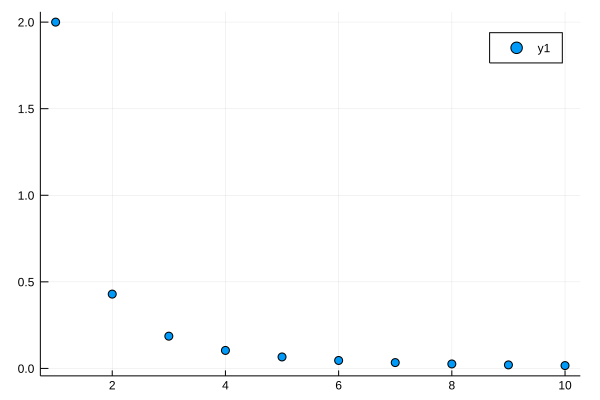

In [27]:
function trapezes(a, b, f, k)
    width = (b - a) / k
    sum = 0
    for i = 0:(k - 1)
        sum += (width * (f(a + i * width) + f(a + (i + 1) * width))) / 2 
    end
    sum
end

errors = []
for j = 1:10
    I = trapezes(0, pi, sin, j)
    push!(errors, 2 - I)
end

scatter(1:10, errors)